In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc




In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [3]:
cd '/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF'

/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF


/Users/derekebowman/miniconda3/envs/CellOracle/lib/python3.10/site-packages/ipython-8.26.0-py3.10.egg/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [4]:
adata = sc.read('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad')


In [5]:
adata

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [6]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'M']
adata = adata[adata.obs['time'] == '8W']


In [7]:
adata

View of AnnData object with n_obs × n_vars = 8802 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [8]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'There was an error'


In [9]:
# Apply the function to each row in adata.obs
adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_86812/774351158.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)


In [10]:
adata.obs[adata.obs.time_diet == 'There was an error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,time_diet


# CellOracle Preprocessing 
https://morris-lab.github.io/CellOracle.documentation/notebooks/03_scRNA-seq_data_preprocessing/scanpy_preprocessing_with_Paul_etal_2015_data.html#Notebook-file

In [11]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

In [12]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')

In [13]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)



OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/derekebowman/miniconda3/envs/CellOracle/lib/python3.10/site-packages/scanpy-1.10.2-py3.10.egg/scanpy/preprocessing/_simple.py:569: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [14]:
# keep raw cont data before log transformation
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [15]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

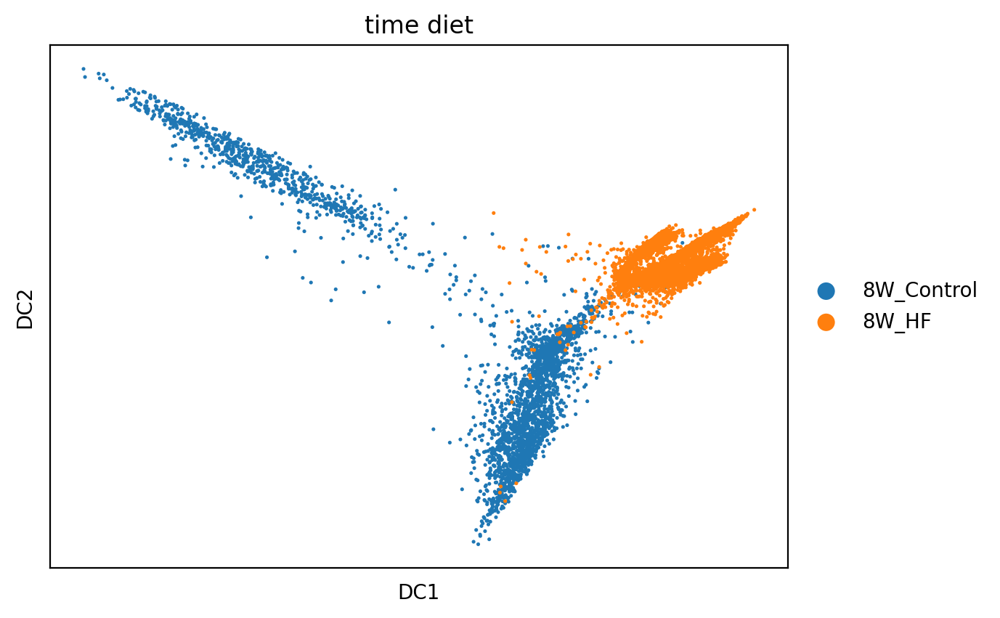

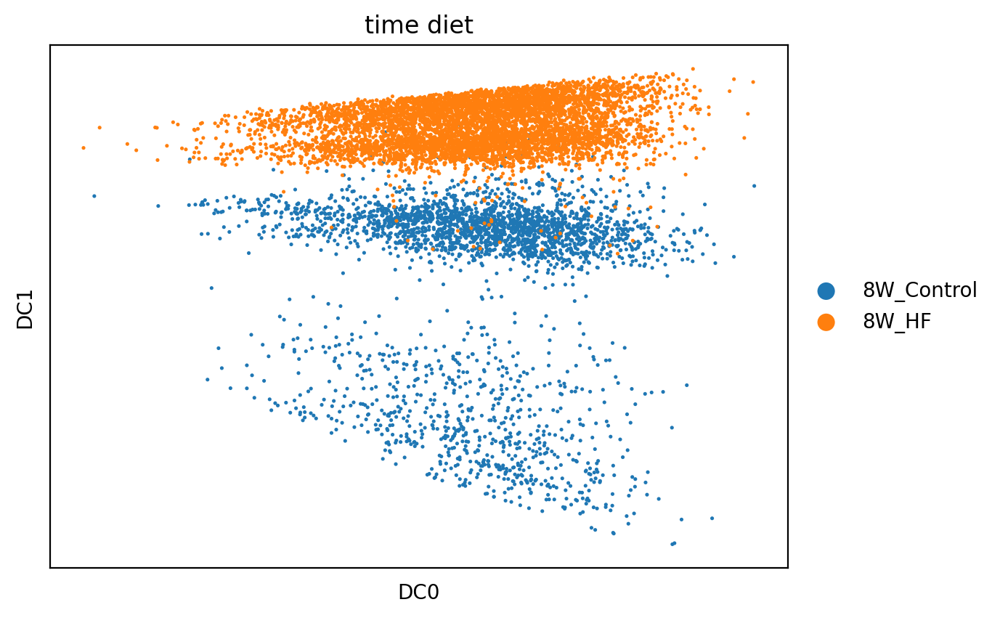

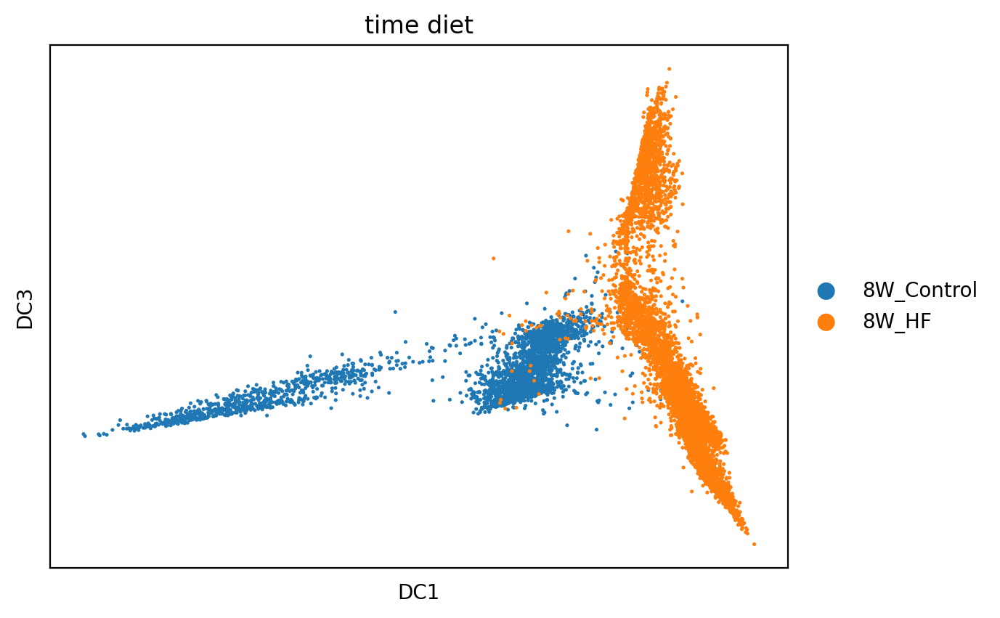

In [16]:
# Taking a look at the diffusion map plots
sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,2])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [0,1])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,3])


In [17]:
# Using leiden instead of louvain
sc.tl.leiden(adata, resolution=0.8)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_86812/1054681846.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.8)


In [18]:
# PAGA graph construction
sc.tl.paga(adata, groups='leiden')

In [19]:
plt.rcParams["figure.figsize"] = [6, 4.5]

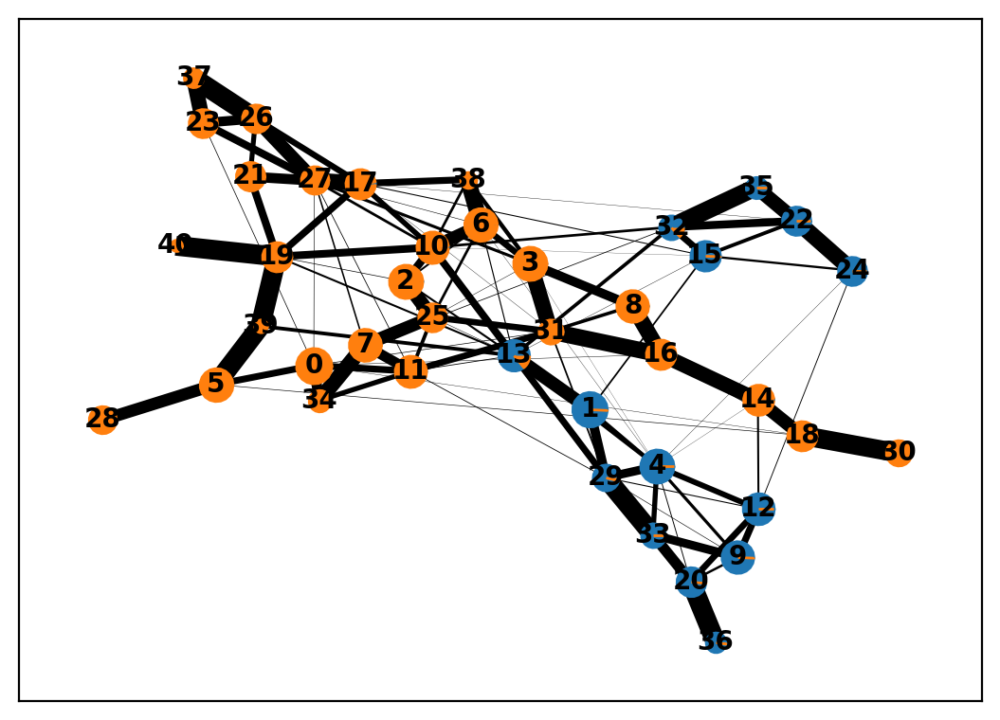

In [20]:
sc.pl.paga(adata, color = 'time_diet')

In [21]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)



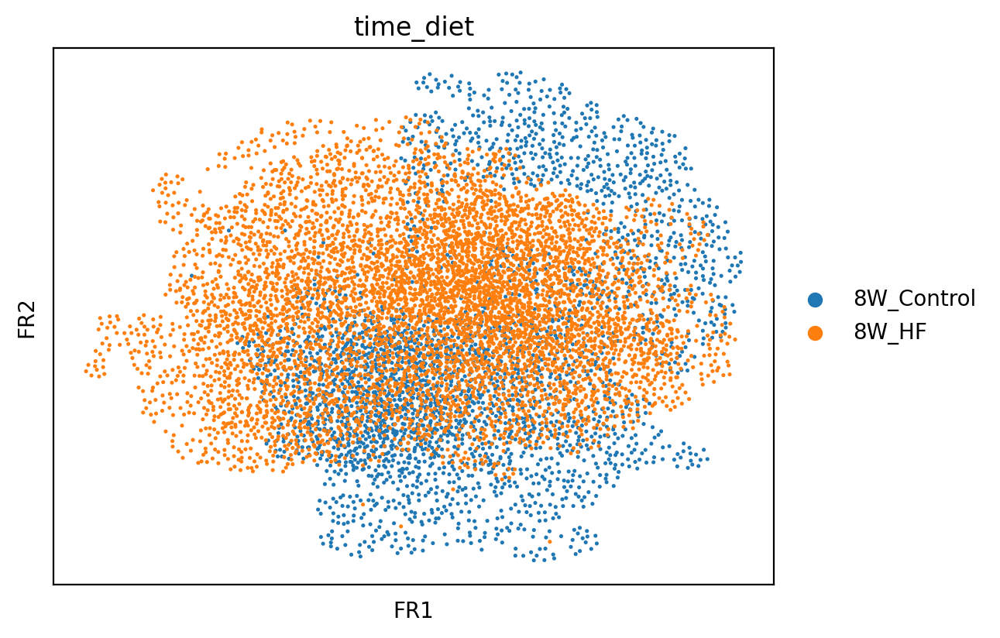

In [22]:
sc.pl.draw_graph(adata, color='time_diet', legend_loc='right margin')



In [23]:
# Save data if desired
# adata.write_h5ad("Your_File_Name_Here.h5ad")

# Preprocessing complete, now Pseudotime Calculation

https://cellrank.readthedocs.io/en/latest/notebooks/tutorials/kernels/300_pseudotime.html

https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Pseudotime_calculation_with_Paul_etal_2015_data.html



In [24]:
import copy
import glob
import time
import os
import shutil
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm.auto import tqdm

In [25]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

'0.18.0'

In [26]:
# Since I could not install fa2, 
# I am creating a new column called X_draw_graph_fa
# that is equivalent to X_draw_graph_fr
adata.obsm['X_draw_graph_fa'] = adata.obsm['X_draw_graph_fr'].copy()

In [27]:
adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa

In [28]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [5,5]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300

%matplotlib inline

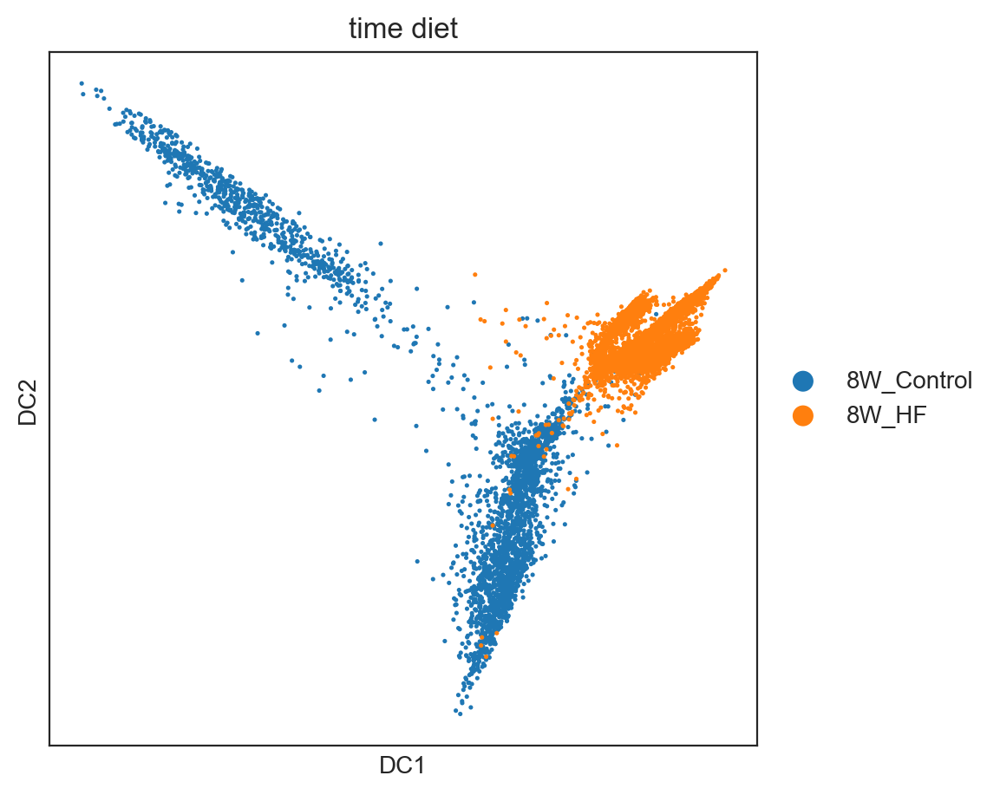

In [29]:
# Plot diffusion map by diet
sc.pl.scatter(adata, 
              basis="diffmap", 
              color="time_diet")

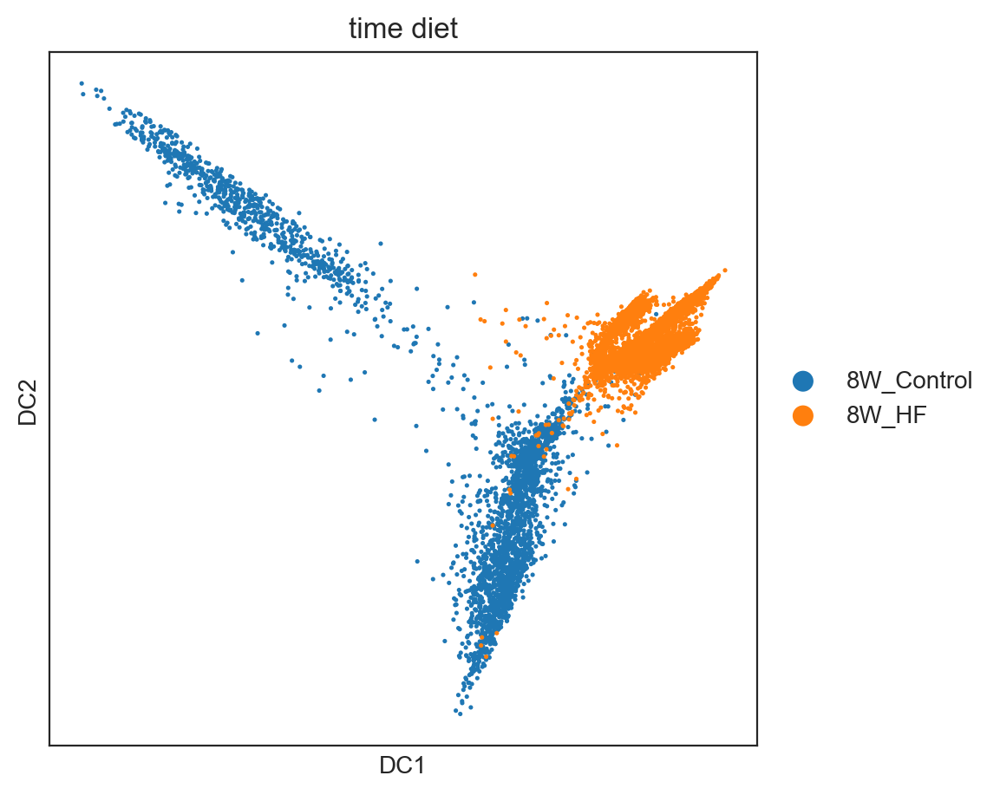

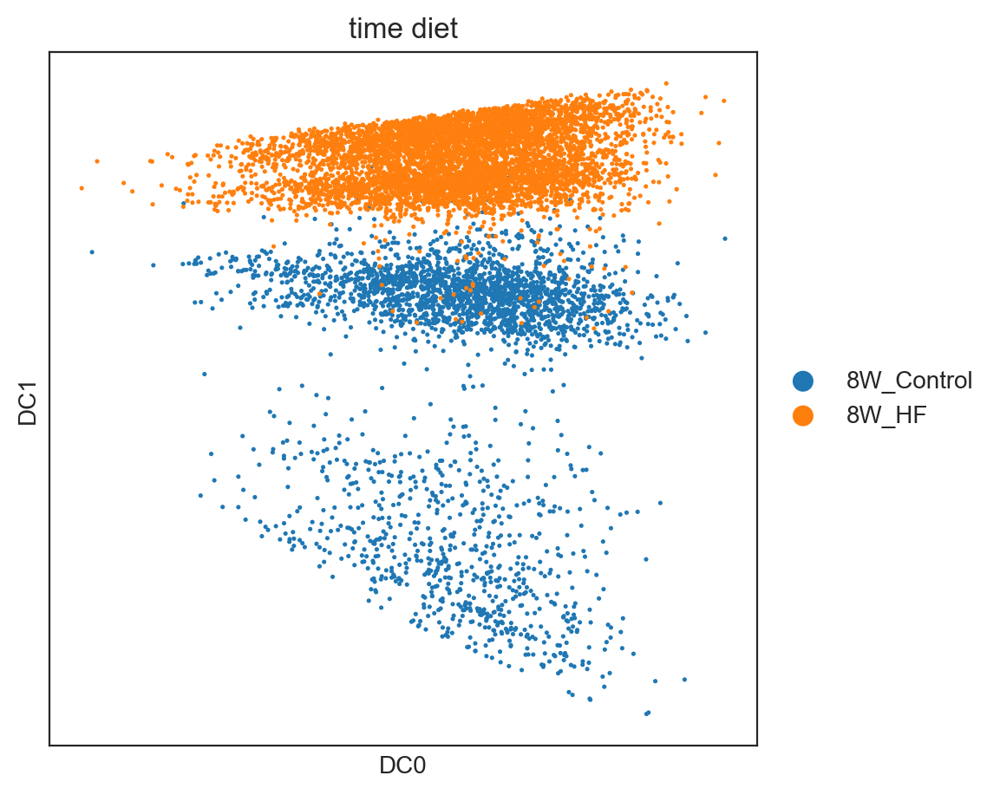

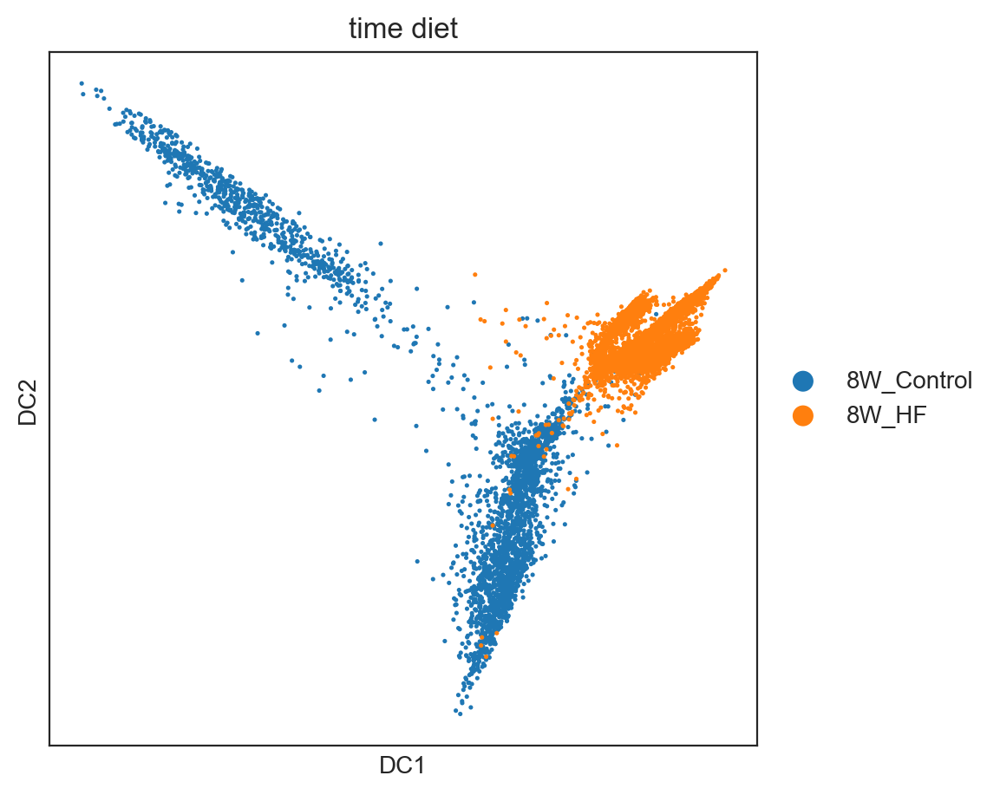

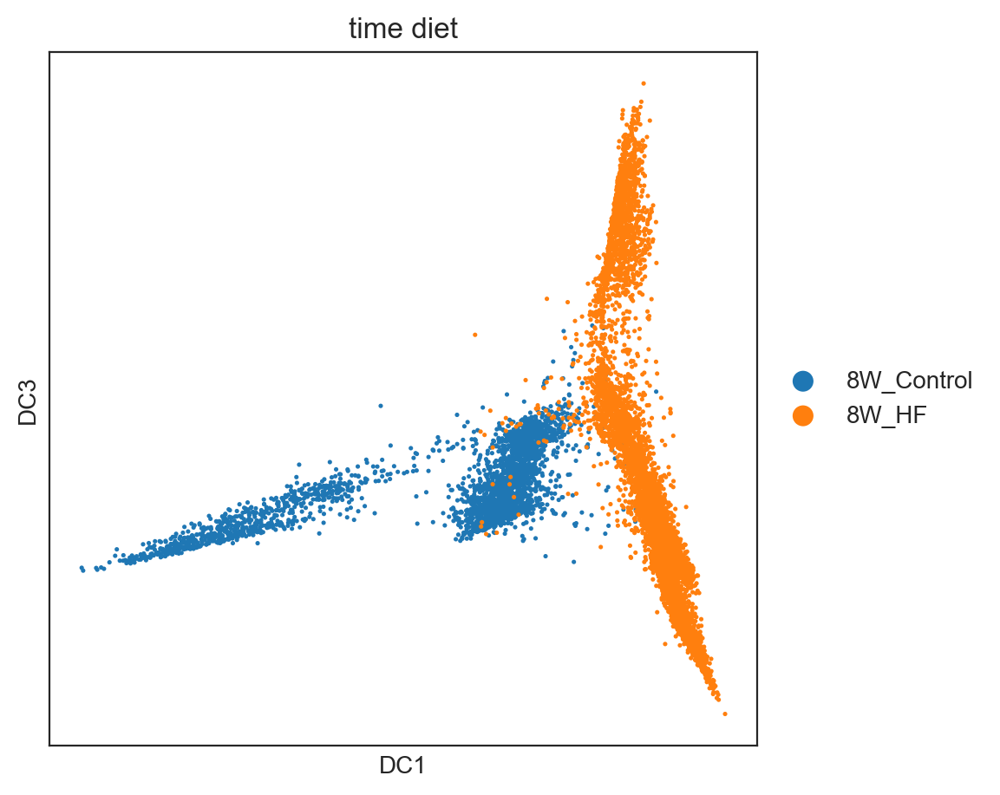

In [30]:
# Setting root cell to the cell with min DC1 value (8W_Control).
root_ixs =adata.obsm["X_diffmap"][:, 1].argmin()

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"])

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[0, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 2],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
)
adata.uns["iroot"] = root_ixs

In [31]:
sc.tl.dpt(adata) 

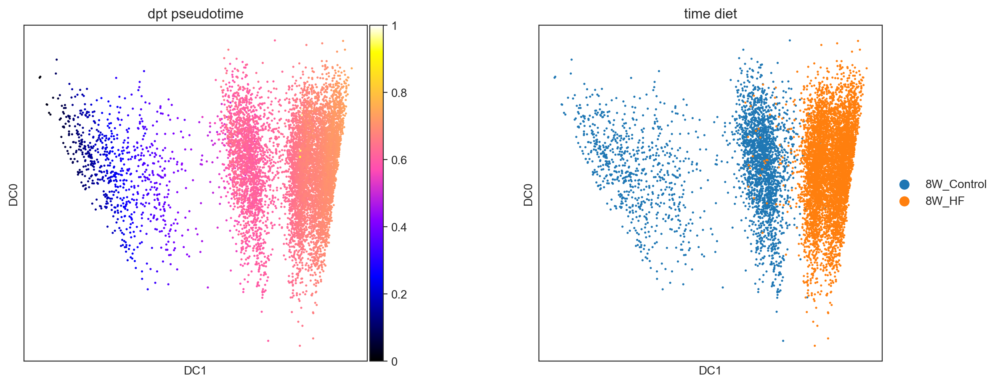

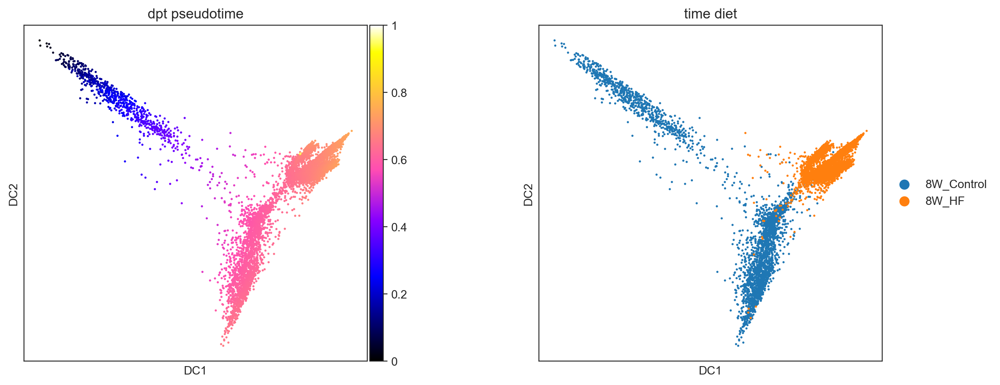

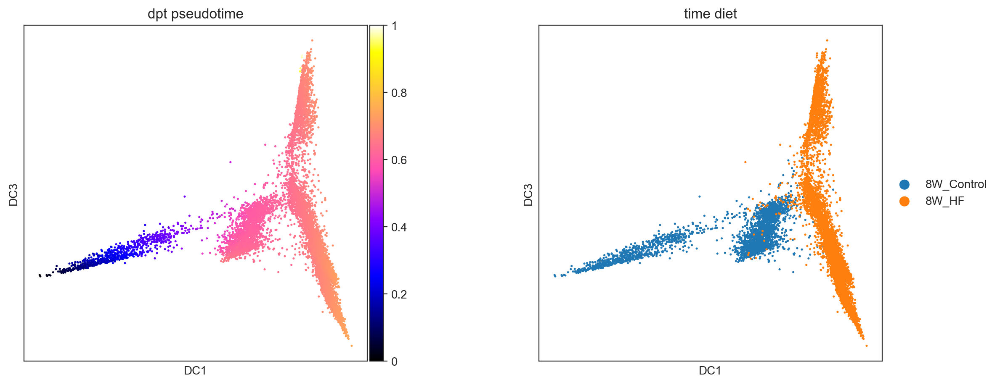

In [32]:
# Plot psedotime on diffusion map
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 0]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 2]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 3]
)

In [33]:
sc.tl.umap(adata)

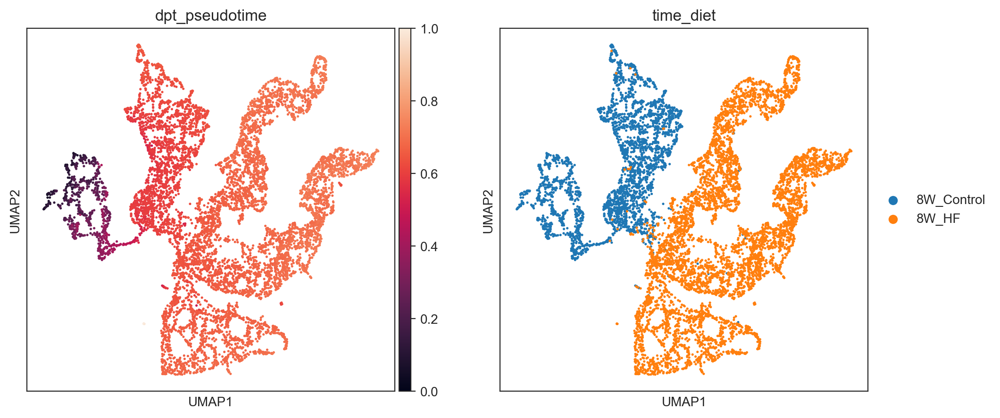

In [34]:
sc.pl.umap(adata, color=['dpt_pseudotime', 'time_diet'],ncols=2)

# Starting GRN Model Construction and Network Analysis 
https://morris-lab.github.io/CellOracle.documentation/notebooks/04_Network_analysis/Network_analysis_with_Paul_etal_2015_data.html

In [35]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


import celloracle as co
co.__version__



'0.18.0'

In [36]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [37]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



In [38]:
# Load the built int rat promoter base GRN.
base_GRN = co.data.load_rat_promoter_base_GRN()

# Check data
base_GRN.head()



Loading prebuilt promoter base-GRN. Version: rn6_gimmemotifsv5_fpr2


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_101287528_101288628,Sox9,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101696238_101697338,Mir297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,chr10_102083380_102084480,Slc39a11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,chr10_102135283_102136383,Sstr2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_102166771_102167871,Cog1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
# Instantiate Oracle object
oracle = co.Oracle()

In [40]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="time_diet",
                                   embedding_name="X_diffmap")

In [41]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

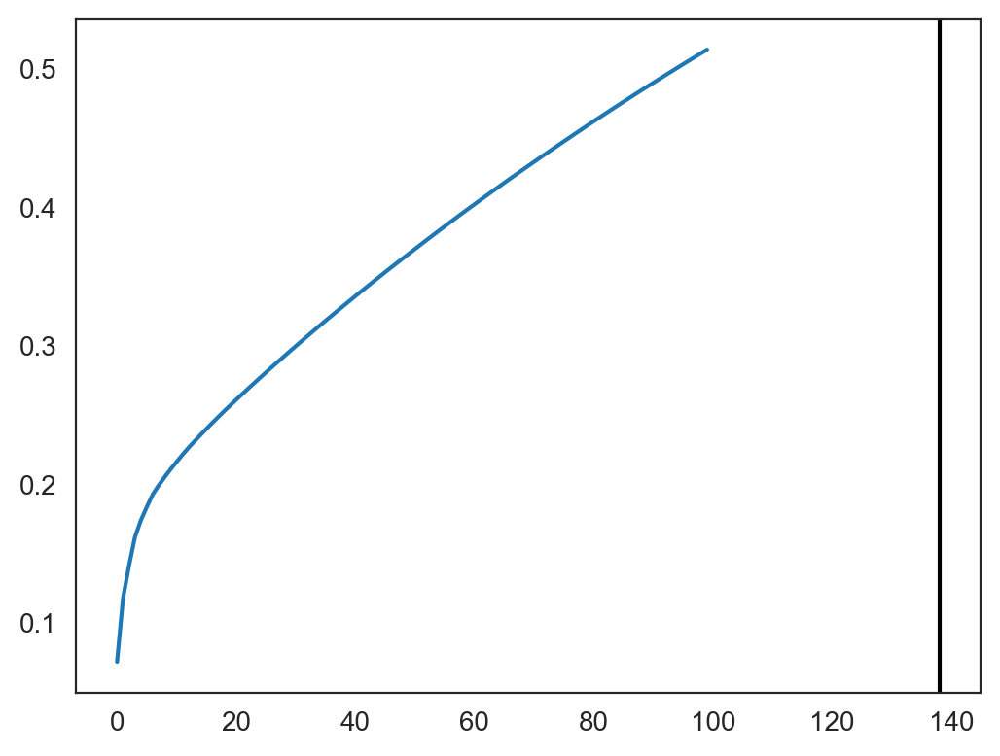

138


In [42]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)



In [43]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :8802


In [44]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")


Auto-selected k is :220


In [45]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=-1)

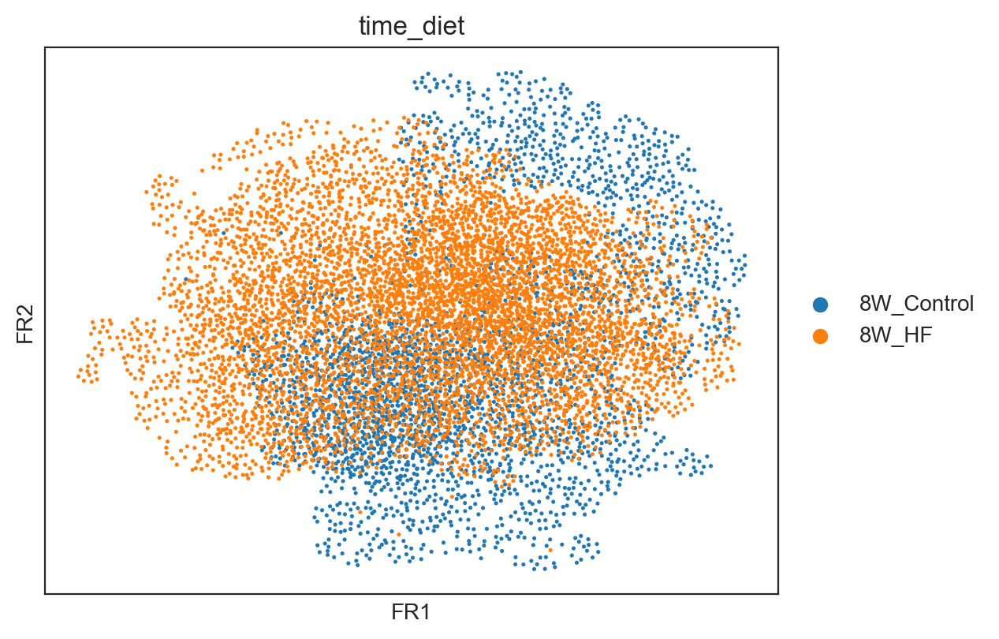

In [46]:
# Check clustering data
sc.pl.draw_graph(oracle.adata, color="time_diet")

In [47]:
%%time
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="time_diet", alpha=10,
                         verbose_level=10, n_jobs=-1)



  0%|          | 0/2 [00:00<?, ?it/s]

Inferring GRN for 8W_Control...


  0%|          | 0/1348 [00:00<?, ?it/s]

Inferring GRN for 8W_HF...


  0%|          | 0/1348 [00:00<?, ?it/s]

CPU times: user 56.7 s, sys: 5.13 s, total: 1min 1s
Wall time: 1min 44s


In [48]:
links.links_dict.keys()



dict_keys(['8W_Control', '8W_HF'])

In [49]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [50]:
HF_8W_GRN = links.filtered_links['8W_HF']
HF_8W_GRN['source'].nunique()

68

In [51]:
Control_8W_GRN = links.filtered_links['8W_Control']
Control_8W_GRN['source'].nunique()

64

In [52]:
plt.rcParams["figure.figsize"] = [9, 4.5]

8W_Control


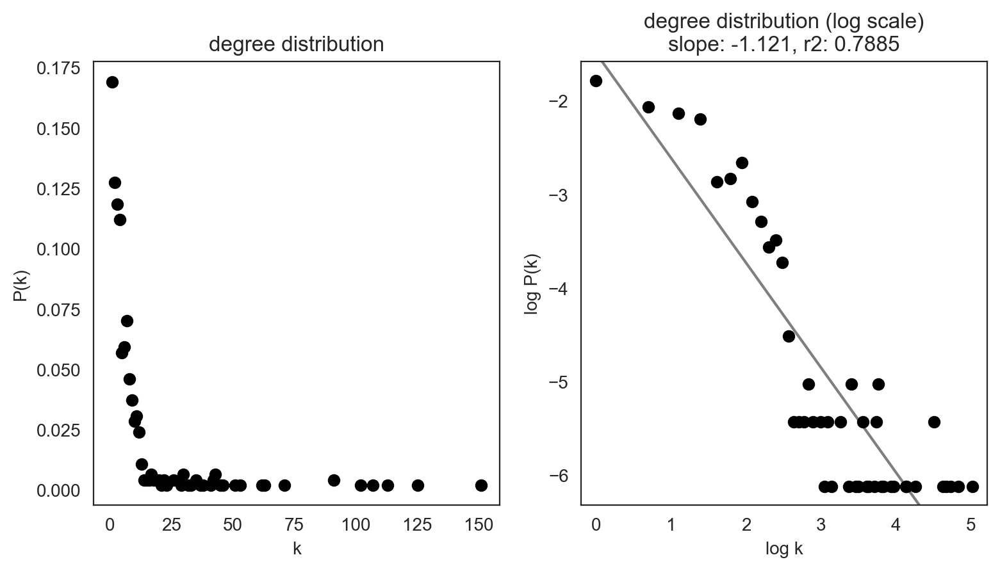

8W_HF


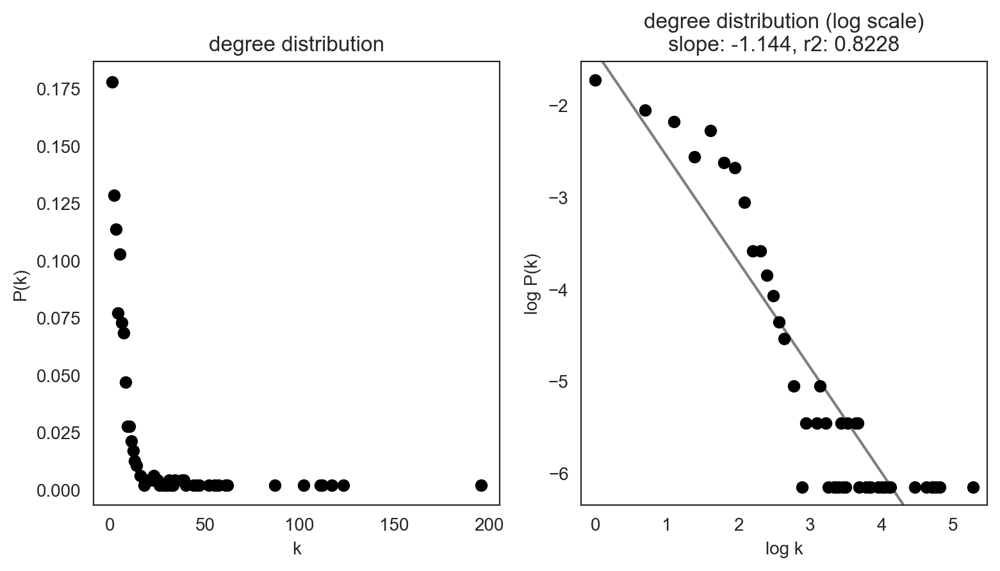

In [53]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )



In [54]:
plt.rcParams["figure.figsize"] = [6, 4.5]


# Calculate network scores.
links.get_network_score()



In [55]:
TFs = oracle.adata.var[oracle.adata.var['isin_TFdict_regulators']].index

In [56]:
TFs

Index(['Ar', 'Arid5b', 'Barx2', 'Batf', 'Bhlhe40', 'Cdx2', 'Cebpb', 'Dux4',
       'E2f1', 'E2f7', 'Ebf1', 'Eomes', 'Ezh2', 'Fli1', 'Foxa2', 'Foxo1',
       'Foxo3', 'Gata3', 'Glis3', 'Hivep1', 'Hivep2', 'Hlx', 'Hmga2', 'Hsf4',
       'Ikzf3', 'Irx2', 'Lbx2', 'Maf', 'Mbd1', 'Mecom', 'Mef2c', 'Meis3',
       'Mxi1', 'Myc', 'Nfe2', 'Nfia', 'Npas3', 'Nr2c2', 'Nr4a1', 'Nr4a2',
       'Pax6', 'Phox2a', 'Plagl1', 'Pou3f2', 'Ppara', 'Pparg', 'Ppargc1a',
       'Prdm11', 'Prdm16', 'Prrx1', 'Pten', 'Rax', 'Rfx5', 'Runx1', 'Rxrg',
       'Scrt1', 'Sim1', 'Six2', 'Smarca1', 'Sox10', 'Sox21', 'Sp5', 'Spic',
       'Stat2', 'Stat3', 'Stat5a', 'Tbx5', 'Tcf7l1', 'Tead1', 'Tead2',
       'Trim28', 'Vdr', 'Xbp1', 'Ybx2', 'Zbtb16', 'Zscan10'],
      dtype='object')

In [57]:
links_df = links.merged_score.copy()

In [58]:
links_df

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Ebf1,108,0.237885,9,0.019824,99,0.218062,2618.0,1.000000,8W_Control
Acly,10,0.022026,10,0.022026,0,0.000000,0.0,0.551707,8W_Control
Npas3,62,0.136564,0,0.000000,62,0.136564,0.0,0.283393,8W_Control
Ntrk3,15,0.033040,15,0.033040,0,0.000000,0.0,0.185957,8W_Control
Tead1,29,0.063877,11,0.024229,18,0.039648,652.0,0.415229,8W_Control
...,...,...,...,...,...,...,...,...,...
Nnmt,1,0.002151,1,0.002151,0,0.000000,0.0,0.001785,8W_HF
Kcnq5,1,0.002151,1,0.002151,0,0.000000,0.0,0.003946,8W_HF
Pls3,1,0.002151,1,0.002151,0,0.000000,0.0,0.000870,8W_HF
Lbx2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000113,8W_HF


In [59]:
# Creating a dataframe that includes only transcription factors
TF_links_df = links_df.loc[links_df.index.isin(TFs)]


In [60]:
TF_links_df 

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Ebf1,108,0.237885,9,0.019824,99,0.218062,2618.0,1.000000,8W_Control
Npas3,62,0.136564,0,0.000000,62,0.136564,0.0,0.283393,8W_Control
Tead1,29,0.063877,11,0.024229,18,0.039648,652.0,0.415229,8W_Control
Rxrg,72,0.158590,2,0.004405,70,0.154185,2010.0,0.303253,8W_Control
Bhlhe40,153,0.337004,4,0.008811,149,0.328194,3105.0,0.712596,8W_Control
...,...,...,...,...,...,...,...,...,...
Batf,6,0.012903,0,0.000000,6,0.012903,0.0,0.007346,8W_HF
Irx2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000177,8W_HF
Barx2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000352,8W_HF
Hmga2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000160,8W_HF


In [61]:
# Creating separate DataFrames for each cluster
df_8W_HF = TF_links_df [TF_links_df['cluster'] == '8W_HF']
df_8W_Control = TF_links_df [TF_links_df ['cluster'] == '8W_Control']

In [62]:
df_8W_Control

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Ebf1,108,0.237885,9,0.019824,99,0.218062,2618.0,1.000000,8W_Control
Npas3,62,0.136564,0,0.000000,62,0.136564,0.0,0.283393,8W_Control
Tead1,29,0.063877,11,0.024229,18,0.039648,652.0,0.415229,8W_Control
Rxrg,72,0.158590,2,0.004405,70,0.154185,2010.0,0.303253,8W_Control
Bhlhe40,153,0.337004,4,0.008811,149,0.328194,3105.0,0.712596,8W_Control
...,...,...,...,...,...,...,...,...,...
Sox21,5,0.011013,0,0.000000,5,0.011013,0.0,0.007389,8W_Control
Tbx5,8,0.017621,0,0.000000,8,0.017621,0.0,0.007875,8W_Control
Scrt1,3,0.006608,0,0.000000,3,0.006608,0.0,0.002321,8W_Control
Hmga2,1,0.002203,0,0.000000,1,0.002203,0.0,0.000449,8W_Control


In [63]:
df_8W_HF

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Bhlhe40,197,0.423656,4,0.008602,193,0.415054,8443.0,1.000000,8W_HF
Pten,20,0.043011,8,0.017204,12,0.025806,1431.0,0.539425,8W_HF
Foxo1,38,0.081720,13,0.027957,25,0.053763,2396.0,0.302892,8W_HF
Ppargc1a,55,0.118280,6,0.012903,49,0.105376,3078.0,0.342754,8W_HF
Ebf1,124,0.266667,12,0.025806,112,0.240860,3647.0,0.671208,8W_HF
...,...,...,...,...,...,...,...,...,...
Batf,6,0.012903,0,0.000000,6,0.012903,0.0,0.007346,8W_HF
Irx2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000177,8W_HF
Barx2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000352,8W_HF
Hmga2,1,0.002151,0,0.000000,1,0.002151,0.0,0.000160,8W_HF


In [64]:
# Create separate dataframes to append the ratio data to.

ratios_8W_HF_vs_8W_Control = pd.DataFrame(index=df_8W_HF.index)


In [65]:
# Calculate ratios for each centrality measure
for measure in ['eigenvector_centrality', 'betweenness_centrality','degree_centrality_all', 'degree_centrality_out']:
    # Replace zero values with np.nan to avoid division by zero
    
    safe_8W_Control = df_8W_Control[measure].replace(0, np.nan)
    
    # Calculate the ratios
    ratios_8W_HF_vs_8W_Control[measure] = df_8W_HF[measure] / safe_8W_Control
    


# Drop NaN values that might have resulted from division by zero
    ratios_8W_HF_vs_8W_Control.dropna(inplace=True)


top_20_tfs_8W_HF_vs_8W_Control = ratios_8W_HF_vs_8W_Control.sort_values('degree_centrality_out',ascending=False).head(20)

print("8W_HF vs. 8W_Control:", top_20_tfs_8W_HF_vs_8W_Control)






top_20_tfs_8W_HF_vs_8W_Control  = top_20_tfs_8W_HF_vs_8W_Control.rename(columns={'eigenvector_centrality': 'eigenvector_centrality_ratio', 
                                                                        'betweenness_centrality': 'betweenness_centrality_ratio',
                                                                        'degree_centrality_all': 'degree_centrality_all_ratio',
                                                                        'degree_centrality_out': 'degree_centrality_out_ratio'})

print("8W_HF vs. 8W_Control:", top_20_tfs_8W_HF_vs_8W_Control)



8W_HF vs. 8W_Control:           eigenvector_centrality  betweenness_centrality  \
Ezh2                    1.514208                0.813953   
Hlx                     1.350679                2.510204   
Ybx2                    1.064891                0.825000   
Hivep2                  0.821396                0.263043   
Bhlhe40                 1.403319                2.719163   
Tead1                   0.758577                1.705521   
Trim28                  0.774932                0.043124   
Nr4a1                   0.639973                0.481794   
Ebf1                    0.671208                1.393048   
Nr2c2                   0.651646                0.820830   
Ppargc1a                0.908112                1.550630   
Ppara                   1.302636                0.773657   
Cebpb                   0.697353                1.084636   
Hivep1                  1.208810                2.398592   
Tcf7l1                  1.425211                0.628272   
Mecom             

In [66]:
sorted_by_eigenvector_top_20_tfs_8W_HF_vs_8W_Control = top_20_tfs_8W_HF_vs_8W_Control.sort_values('eigenvector_centrality_ratio', ascending=False)
sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control= top_20_tfs_8W_HF_vs_8W_Control.sort_values('degree_centrality_out_ratio', ascending=False)
sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control = top_20_tfs_8W_HF_vs_8W_Control.sort_values('betweenness_centrality_ratio', ascending=False)


In [67]:
#print(sorted_by_eigenvector_top_20_tfs_24W_HF_vs_24W_Control)
print(sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control)
sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control

          eigenvector_centrality_ratio  betweenness_centrality_ratio  \
Ezh2                          1.514208                      0.813953   
Hlx                           1.350679                      2.510204   
Ybx2                          1.064891                      0.825000   
Hivep2                        0.821396                      0.263043   
Bhlhe40                       1.403319                      2.719163   
Tead1                         0.758577                      1.705521   
Trim28                        0.774932                      0.043124   
Nr4a1                         0.639973                      0.481794   
Ebf1                          0.671208                      1.393048   
Nr2c2                         0.651646                      0.820830   
Ppargc1a                      0.908112                      1.550630   
Ppara                         1.302636                      0.773657   
Cebpb                         0.697353                      1.08

,eigenvector_centrality_ratio,betweenness_centrality_ratio,degree_centrality_all_ratio,degree_centrality_out_ratio
Nfia,0.394145,16.316265,0.818018,0.867861
Stat5a,0.766303,13.890819,0.976344,0.875343
Ar,0.784201,2.775459,0.882465,0.876717
Bhlhe40,1.403319,2.719163,1.257123,1.264660
Hlx,1.350679,2.510204,1.534255,1.464516
Hivep1,1.208810,2.398592,1.233277,0.976344
Tead1,0.758577,1.705521,1.111012,1.193309
Ppargc1a,0.908112,1.550630,1.013187,1.040019
Ebf1,0.671208,1.393048,1.120988,1.104551
Cebpb,0.697353,1.084636,1.001814,0.993779


In [68]:
eigenvector_sorted_gene_list_8W_HF_vs_8W_Control= list(sorted_by_eigenvector_top_20_tfs_8W_HF_vs_8W_Control.index)
degree_centrality_out_sorted_gene_list_8W_HF_vs_8W_Control = list(sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control.index)
betweenness_centrality_sorted_gene_list_8W_HF_vs_8W_Control = list(sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control.index)

In [69]:
# Map genes to their positions in each list
positions_eigenvector_sorted_8W_HF_vs_8W_Control = {gene: i for i, gene in enumerate(eigenvector_sorted_gene_list_8W_HF_vs_8W_Control)}
positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control  = {gene: i for i, gene in enumerate(degree_centrality_out_sorted_gene_list_8W_HF_vs_8W_Control)}
positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control= { gene: i for i, gene in enumerate(betweenness_centrality_sorted_gene_list_8W_HF_vs_8W_Control)}
print("Positions based on eigenvector:", positions_eigenvector_sorted_8W_HF_vs_8W_Control)
print("Positions based on degree centrality out:", positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control)
print("Positions based on betweenness centrality:",positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control)


Positions based on eigenvector: {'Ezh2': 0, 'Tcf7l1': 1, 'Bhlhe40': 2, 'Hlx': 3, 'Ppara': 4, 'Hivep1': 5, 'Ybx2': 6, 'Mecom': 7, 'Ppargc1a': 8, 'Hivep2': 9, 'Ar': 10, 'Trim28': 11, 'Stat5a': 12, 'Tead1': 13, 'Cebpb': 14, 'Ebf1': 15, 'Nr2c2': 16, 'Nr4a1': 17, 'Nr4a2': 18, 'Nfia': 19}
Positions based on degree centrality out: {'Ezh2': 0, 'Hlx': 1, 'Ybx2': 2, 'Hivep2': 3, 'Bhlhe40': 4, 'Tead1': 5, 'Trim28': 6, 'Nr4a1': 7, 'Ebf1': 8, 'Nr2c2': 9, 'Ppargc1a': 10, 'Ppara': 11, 'Cebpb': 12, 'Hivep1': 13, 'Tcf7l1': 14, 'Mecom': 15, 'Nr4a2': 16, 'Ar': 17, 'Stat5a': 18, 'Nfia': 19}
Positions based on betweenness centrality: {'Nfia': 0, 'Stat5a': 1, 'Ar': 2, 'Bhlhe40': 3, 'Hlx': 4, 'Hivep1': 5, 'Tead1': 6, 'Ppargc1a': 7, 'Ebf1': 8, 'Cebpb': 9, 'Ybx2': 10, 'Nr2c2': 11, 'Ezh2': 12, 'Ppara': 13, 'Tcf7l1': 14, 'Nr4a1': 15, 'Mecom': 16, 'Hivep2': 17, 'Trim28': 18, 'Nr4a2': 19}


In [70]:
# Create a DataFrame with genes as the index and positions as the columns
positions_8W_HF_vs_8W_Control = pd.DataFrame({'Eigenvector_Centrality_Rank': positions_eigenvector_sorted_8W_HF_vs_8W_Control, 
                                          'Degree_Centrality_Out_Rank': positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control,
                                          'Betweenness_Centrality_Rank': positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control})

positions_8W_HF_vs_8W_Control['Total_Ranking_Score'] = positions_8W_HF_vs_8W_Control.sum(axis=1)

positions_8W_HF_vs_8W_Control = positions_8W_HF_vs_8W_Control.sort_values('Total_Ranking_Score', ascending=True)

In [71]:
positions_8W_HF_vs_8W_Control

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Hlx,3,1,4,8
Bhlhe40,2,4,3,9
Ezh2,0,0,12,12
Ybx2,6,2,10,18
Hivep1,5,13,5,23
Tead1,13,5,6,24
Ppargc1a,8,10,7,25
Ppara,4,11,13,28
Ar,10,17,2,29
Hivep2,9,3,17,29


In [72]:
HF_TFs = list(df_8W_HF.index)
Control_TFs = list(df_8W_Control.index)

In [73]:
Only_HF_TFs = list(set(HF_TFs) - set(Control_TFs))

In [74]:
Only_HF_TFs

['Ikzf3', 'Six2', 'Lbx2', 'Barx2', 'Smarca1']

# Save links and oracles object (optional)

In [75]:
#links.to_hdf5(file_path="Oct_Males_Only_8WC_8W_HF.celloracle.links")
#oracle.to_hdf5(file_path="Oct_Males_Only_8WC_8W_HF.celloracle.oracle")

# In Silico Gene Perturbation with GRNs
https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Gata1_KO_simulation_with_Paul_etal_2015_data.html#Notebook-file

In [76]:
import os
import sys
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
co.__version__


'0.18.0'

In [77]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline



In [78]:
# Make folder to save plots
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



# Load the links and oracle datasets, if you've already generated them

In [79]:
# Attention!! Please use the function below when you use your data.
oracle = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF/Oct_Males_Only_8WC_8W_HF.celloracle.oracle')
# Attention!! Please use the function below when you use your data.
links = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF/Oct_Males_Only_8WC_8W_HF.celloracle.links')

In [80]:
oracle.adata

AnnData object with n_obs × n_vars = 8802 × 1999
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'time_diet', 'n_counts_all', 'n_counts', 'leiden', 'dpt_pseudotime'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'n_counts', 'mean

In [81]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)



  0%|          | 0/2 [00:00<?, ?it/s]

In [82]:
Only_HF_TFs

['Ikzf3', 'Six2', 'Lbx2', 'Barx2', 'Smarca1']

In [122]:
oracle.adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa, X_umap

In [123]:
oracle.embedding = oracle.adata.obsm['X_umap'] 
oracle.embedding_name = 'X_umap'

In [124]:
oracle.embedding_name 

'X_umap'

In [125]:
Only_HF_TFs

['Ikzf3', 'Six2', 'Lbx2', 'Barx2', 'Smarca1']

In [126]:

positions_8W_HF_vs_8W_Control.head(5)

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Hlx,3,1,4,8
Bhlhe40,2,4,3,9
Ezh2,0,0,12,12
Ybx2,6,2,10,18
Hivep1,5,13,5,23


In [132]:
goi = positions_8W_HF_vs_8W_Control.index[0:3]


In [133]:
genes_of_interest = f'{goi[0]}, {goi[1]}, and {goi[2]}'

In [134]:
print(goi)

Index(['Hlx', 'Bhlhe40', 'Ezh2'], dtype='object')


In [136]:
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={f'{goi[0]}': 0.0 , f'{goi[1]}': 0.0 , f'{goi[2]}': 0.0},
                      n_propagation=3)



In [137]:
%%time
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)

CPU times: user 50.5 s, sys: 7.89 s, total: 58.4 s
Wall time: 18.1 s


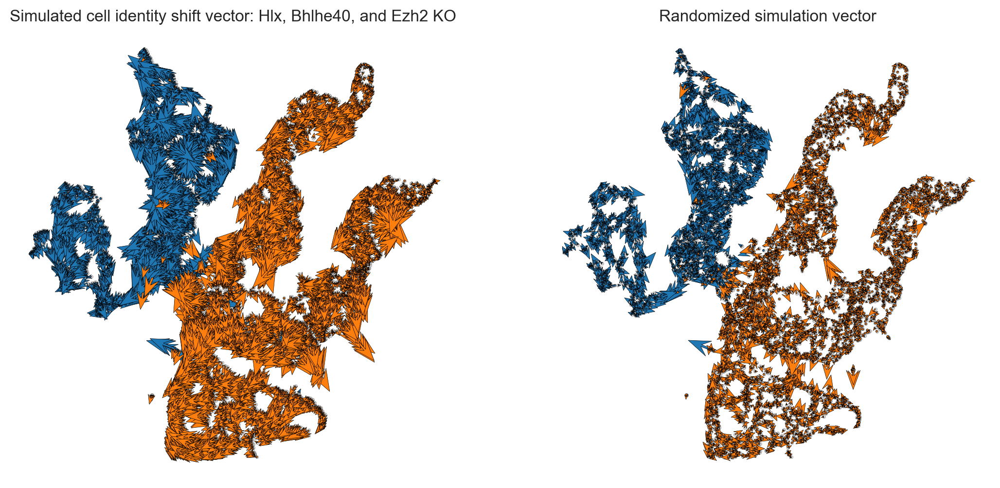

In [138]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [139]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

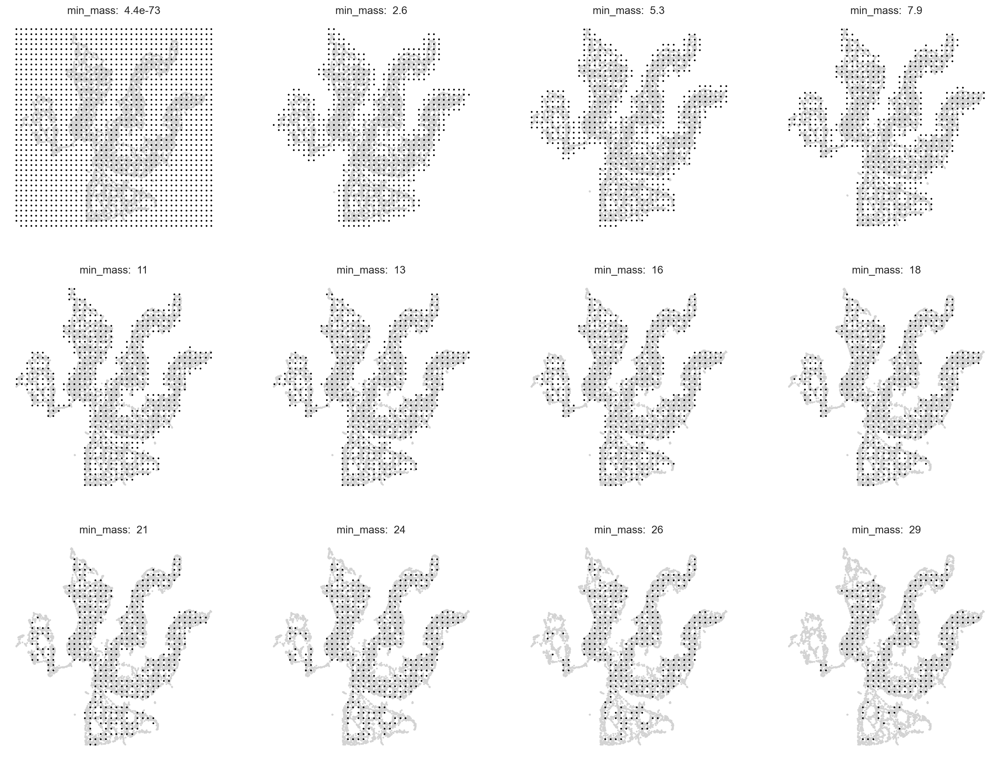

In [140]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)



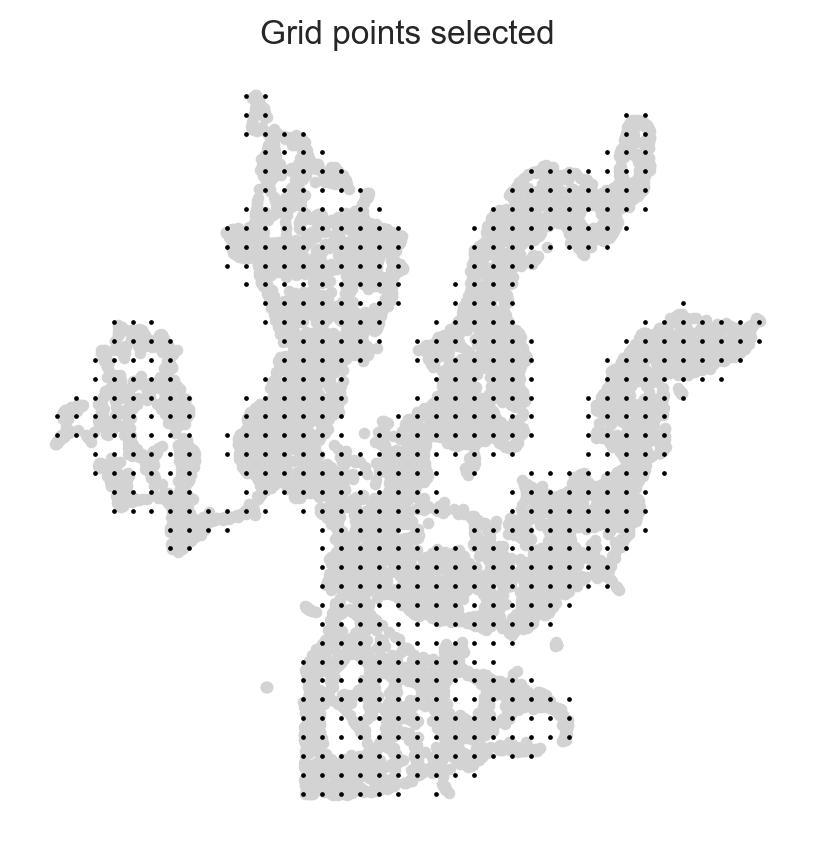

In [141]:
min_mass = 10  #1.5 #2.9e+04  # 5e+03 4.9e+03 #1.9e+04
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

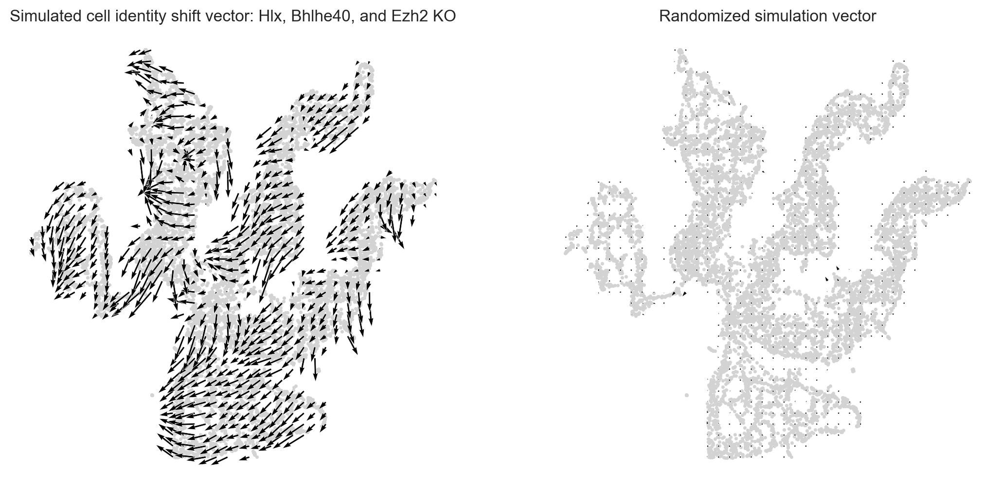

In [142]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 15
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

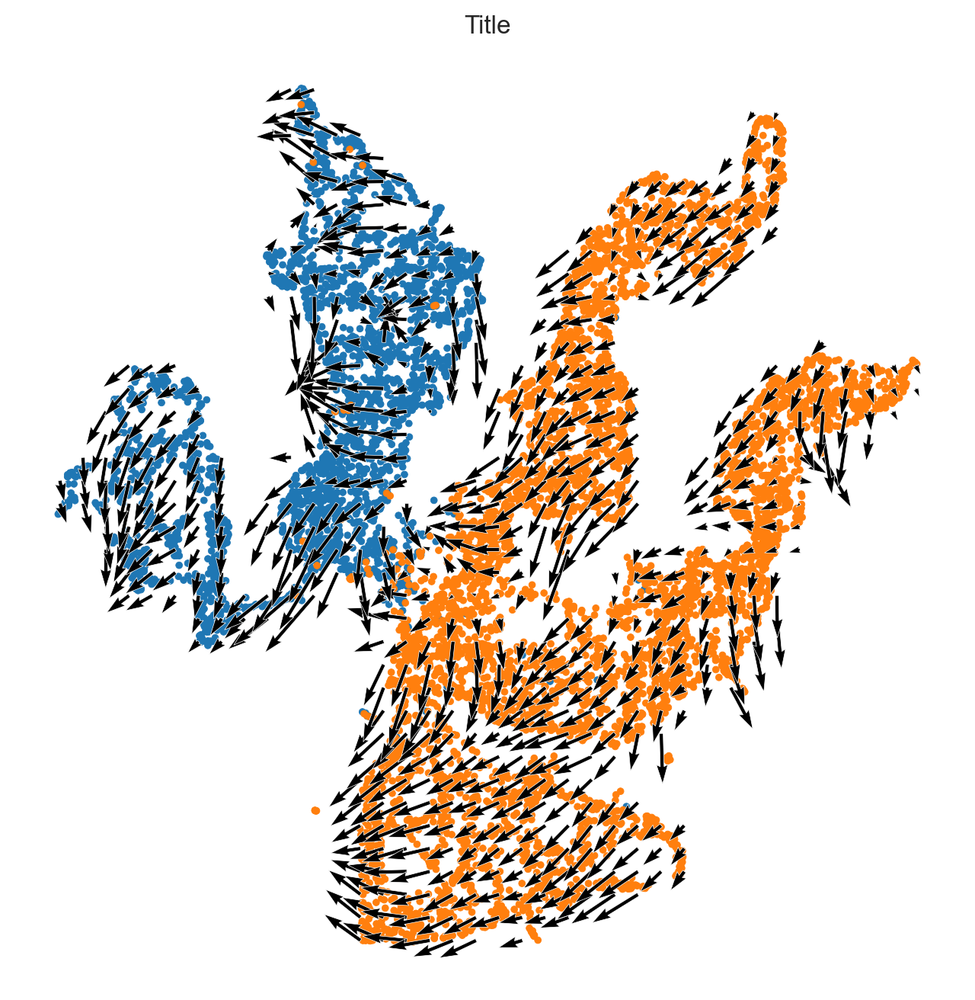

In [143]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

# Compare Simulation Vector with Development Vectors

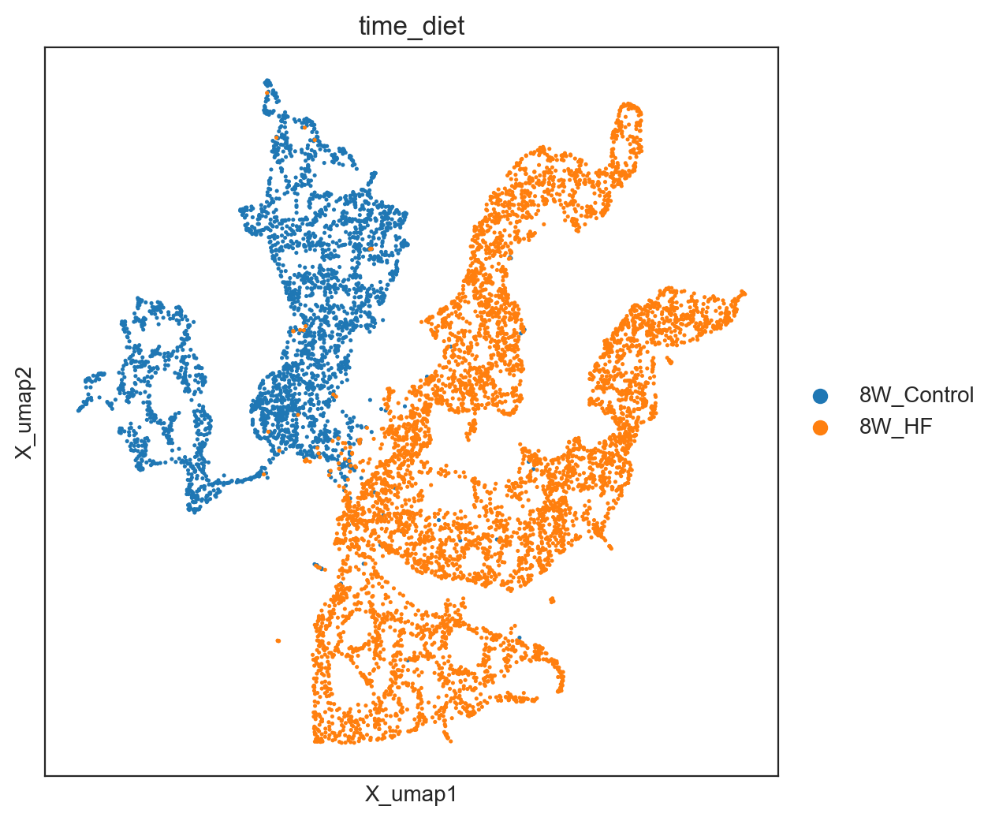

In [144]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=['time_diet'])

In [145]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="dpt_pseudotime")


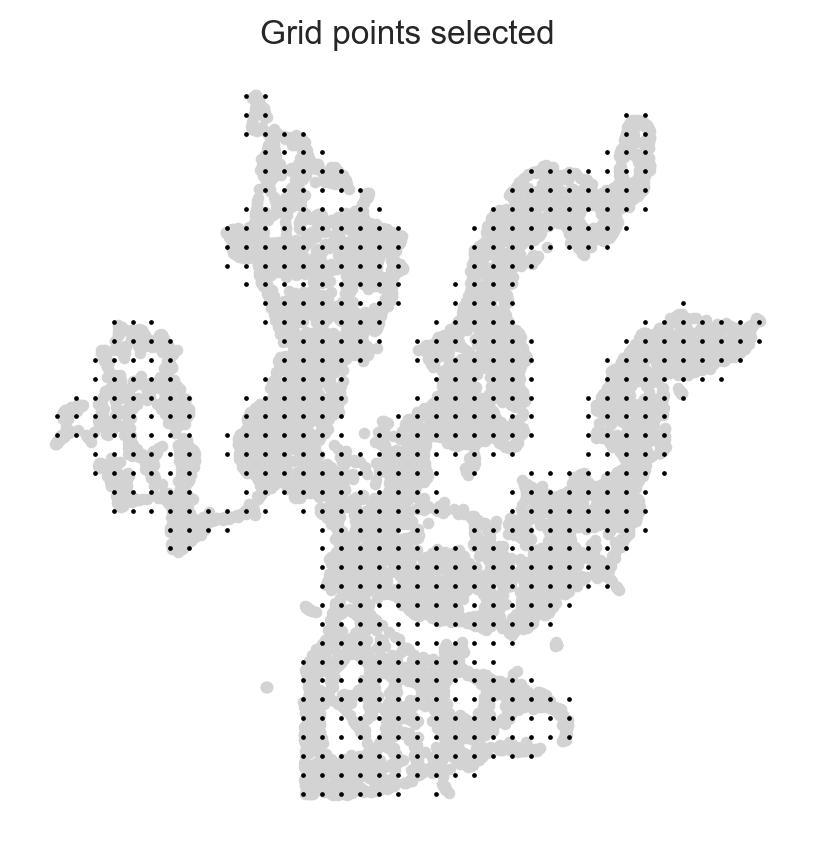

In [146]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

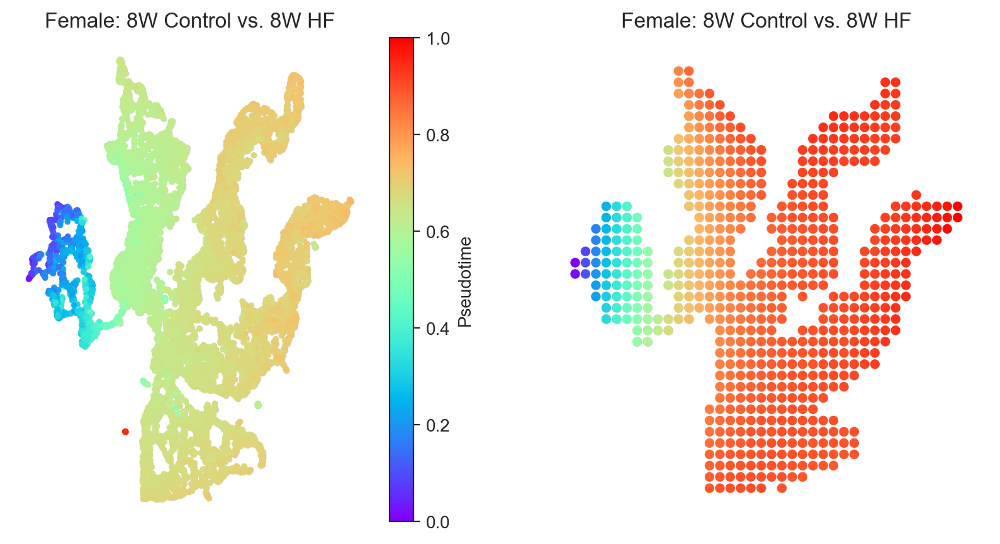

In [147]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True, title ='Female: 8W Control vs. 8W HF')

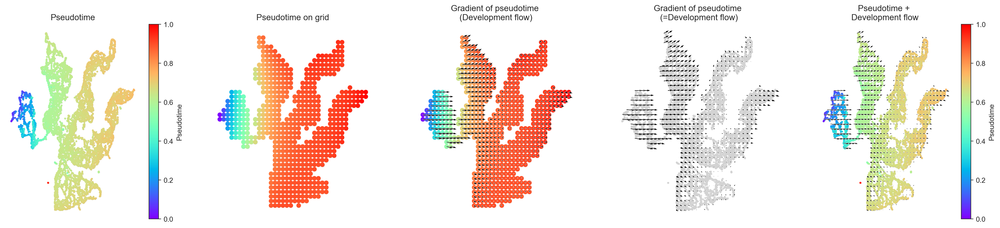

In [ ]:
# Calculate gradient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)



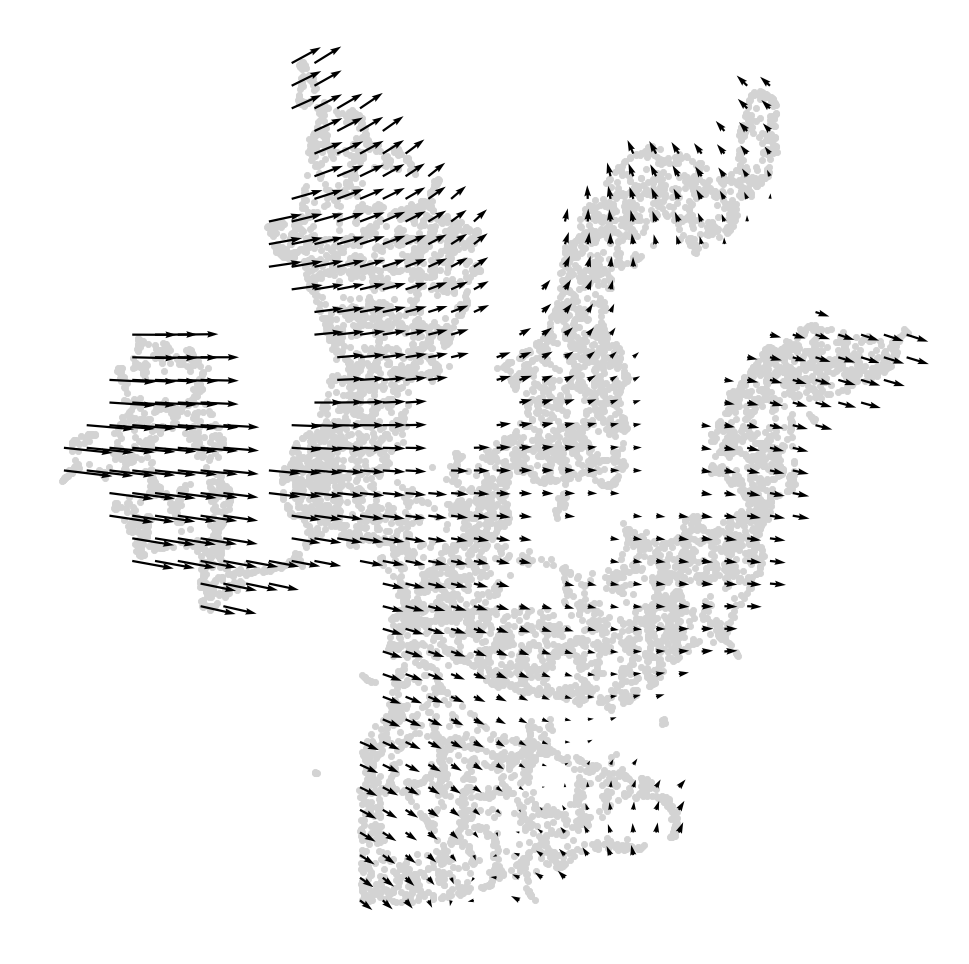

In [149]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [150]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)



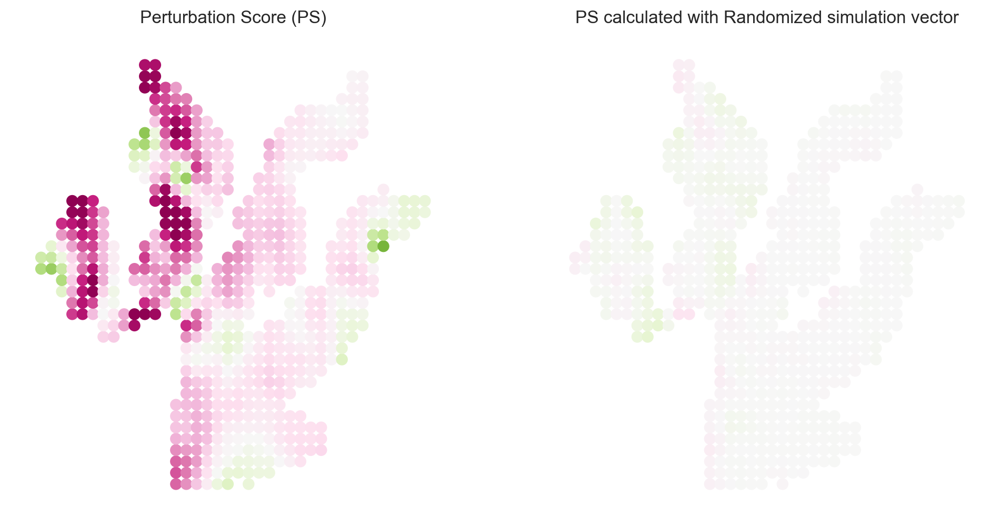

In [151]:
# Show perturbation scores
vm = 0.75

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax[0])
ax[0].set_title(f"Perturbation Score (PS)")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()



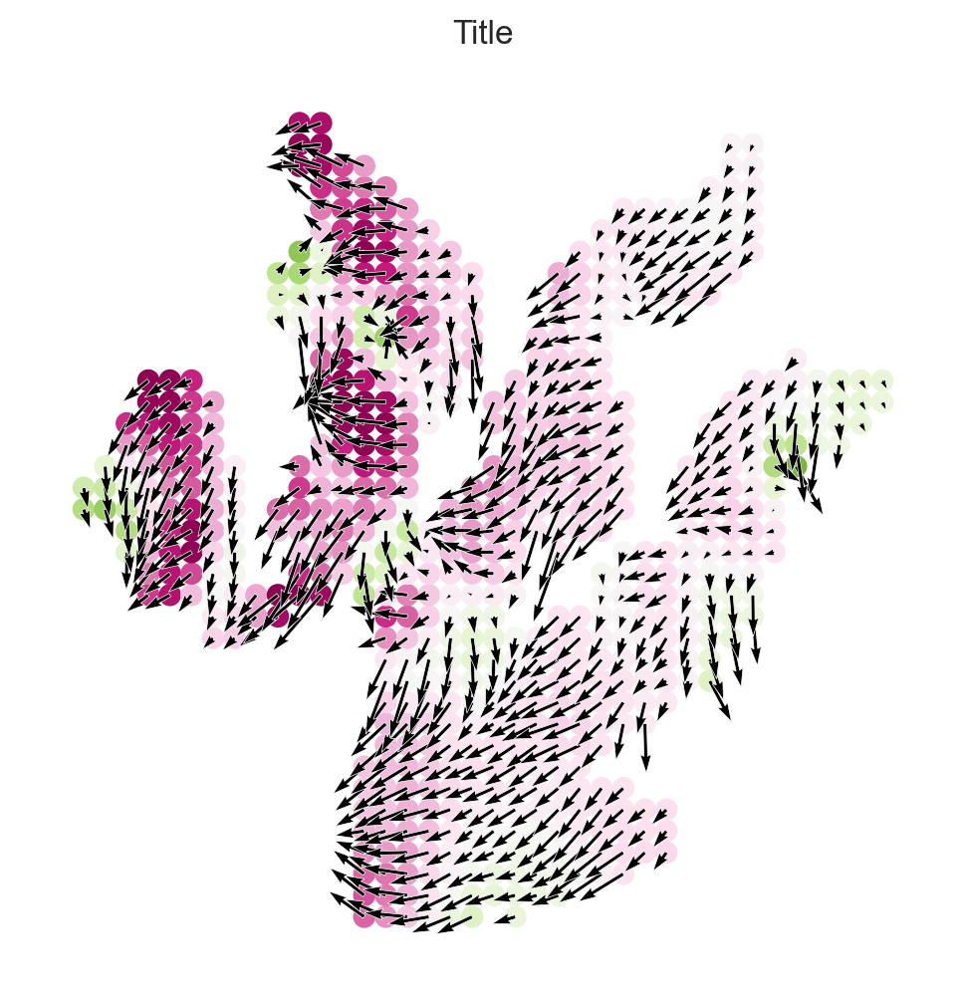

In [152]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

2024-10-04 17:08:57,516 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-10-04 17:08:57,520 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


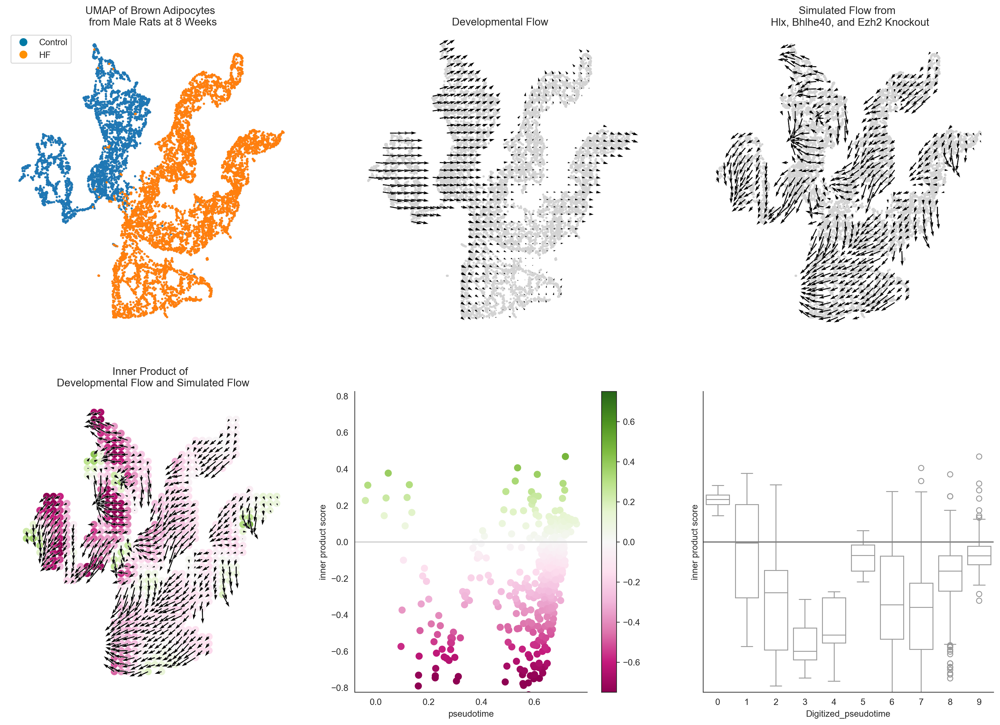

In [153]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm, title=['UMAP of Brown Adipocytes \n from Male Rats at 8 Weeks','Developmental Flow',f'Simulated Flow from \n {genes_of_interest} Knockout','Inner Product of \n Developmental Flow and Simulated Flow','',''], 
                                          legend= [['Control', 'HF']], label_colors= ["#007aa5", "#ff9000"] ) # Blue and Orange



